In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
def apply_gamma_correction(img, gamma=2.2):
    inv_gamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** inv_gamma * 255 for i in np.arange(256)]).astype("uint8")
    return cv2.LUT(img, table)

In [3]:
def is_underexposed(img, threshold=70):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l_channel = lab[:, :, 0]
    mean_luminance = np.mean(l_channel)
    return mean_luminance < threshold

In [4]:
def is_blurry(img, threshold=100):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    return laplacian_var < threshold

In [5]:
def unsharp_mask(img):
    gaussian = cv2.GaussianBlur(img, (9, 9), 10.0)
    unsharp = cv2.addWeighted(img, 1.5, gaussian, -0.5, 0)
    return unsharp

In [6]:
def is_noisy(img, threshold=20):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    lap = cv2.Laplacian(gray, cv2.CV_64F)
    stddev = np.std(lap)
    return stddev > threshold

In [7]:
def denoise_image(img):
    return cv2.fastNlMeansDenoisingColored(img, None, 10, 20, 7, 35)

In [8]:
def smart_preprocess(img):
    print("Starting Smart Preprocessing...")

    if is_underexposed(img):
        print("Image is underexposed. Applying gamma correction.")
        img = apply_gamma_correction(img, gamma=2.0)
    
    if is_blurry(img):
        print("Image is blurry. Applying unsharp masking.")
        img = unsharp_mask(img)
    
    if is_noisy(img):
        print("Image is noisy. Applying denoising.")
        img = denoise_image(img)
    
    return img

In [9]:
def display(img1,img2):
    plt.figure(figsize=(35,35))

    plt.subplot(1, 2, 1)
    plt.imshow(img1)

    plt.subplot(1, 2, 2)
    plt.imshow(img2)

## Input Dull Image

In [10]:
img1 = cv2.imread(r"PATH/TO/IMAGE")

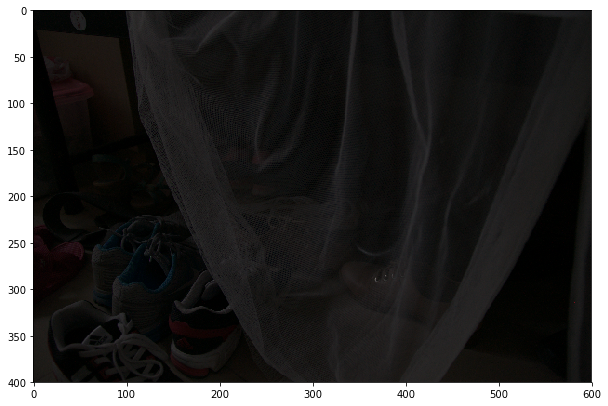

In [11]:
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10))
plt.imshow(img1)

## Input Enhanced Image

Starting Smart Preprocessing...
Image is underexposed. Applying gamma correction.
Image is noisy. Applying denoising.


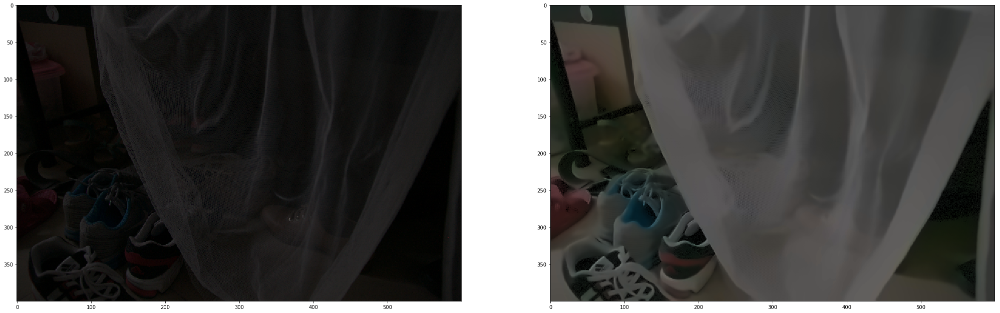

In [12]:
img = smart_preprocess(img1)
display(img1,img)

In [13]:
img.shape

(400, 600, 3)

## Global Exposure (Gamma Correction)

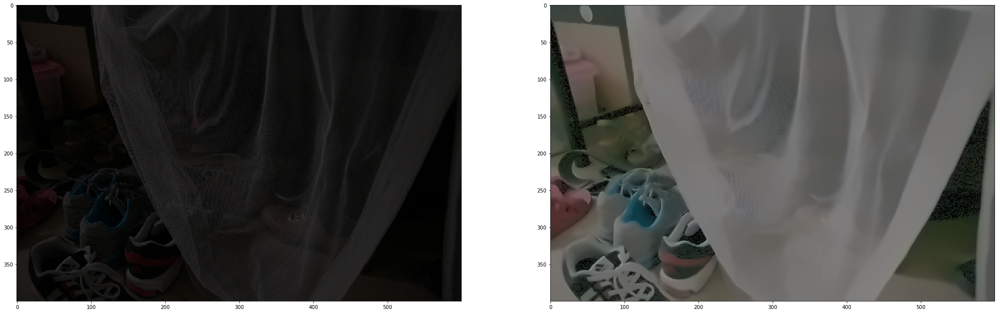

In [14]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
mean_intensity = np.mean(gray)

if mean_intensity < 100:
    gamma = 0.7  # brighten
elif mean_intensity > 150:
    gamma = 1.3  # darken
else:
    gamma = 1.0  # no change


look_up_table = np.array([((i / 255.0) ** gamma) * 255 for i in range(256)]).astype("uint8")
img_exposed = cv2.LUT(img, look_up_table)
display(img1,img_exposed)


Starting Smart Preprocessing...


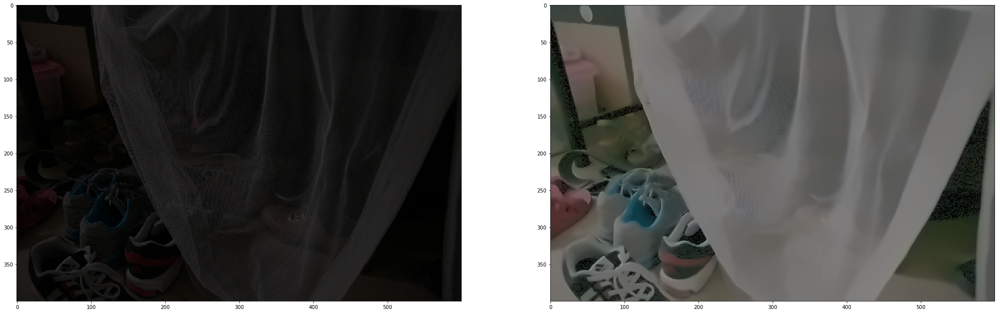

In [15]:
img_exposed = smart_preprocess(img_exposed)
display(img1,img_exposed)

 ## White Balance Correction 

In [16]:
# Gray world assumption method
def white_balance(img):
    result = img.copy().astype(np.float32)
    avg_b = np.mean(result[:, :, 0])
    avg_g = np.mean(result[:, :, 1])
    avg_r = np.mean(result[:, :, 2])
    avg_gray = (avg_b + avg_g + avg_r) / 3

    result[:, :, 0] *= avg_gray / avg_b
    result[:, :, 1] *= avg_gray / avg_g
    result[:, :, 2] *= avg_gray / avg_r
    print(f""" 
    avg_b: {avg_b} -> {avg_gray / avg_b}
    avg_g: {avg_g}  -> {avg_gray / avg_g}
    avg_r: {avg_r}  -> {avg_gray / avg_r}
    avg_gray: {avg_gray}
    """)
    result = np.clip(result, 0, 255).astype(np.uint8)
    return result

In [17]:
img_corrected = white_balance(img_exposed)

 
    avg_b: 92.50994873046875 -> 0.9875782073164375
    avg_g: 92.47748565673828  -> 0.9879248843906577
    avg_r: 89.09500122070312  -> 1.025431371843814
    avg_gray: 91.36080932617188
    


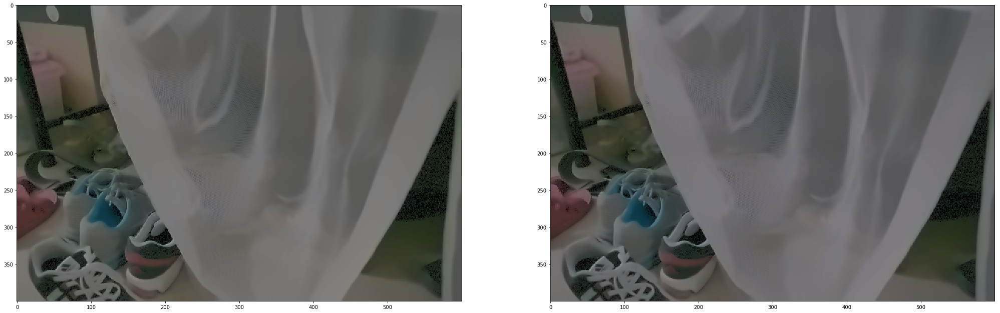

In [18]:
display(img_exposed,img_corrected)

In [19]:
# display(img,img_exposed)

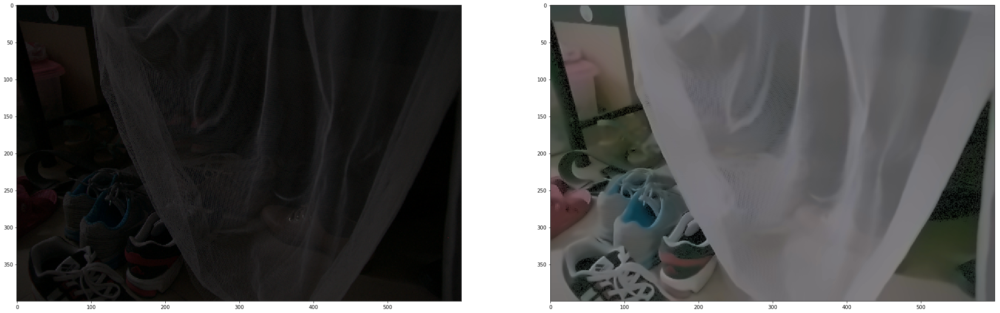

In [20]:
display(img1,img_corrected)  # basically the first stage enhances the overall contrast of the image

## Local Tone Mapping

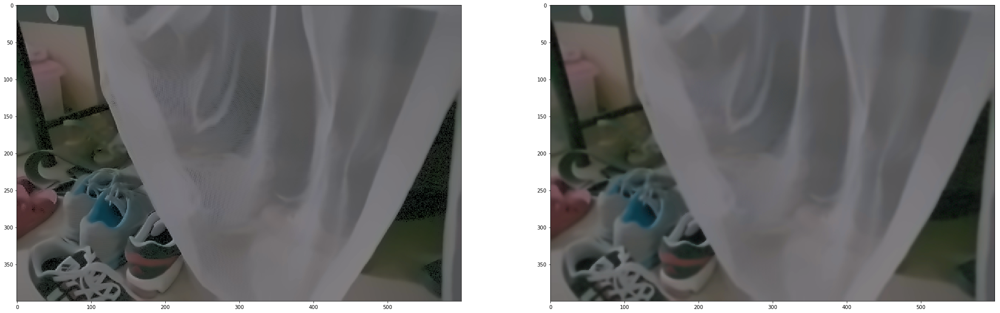

In [21]:
img_c = img_corrected

lab = cv2.cvtColor(img_c, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)

l_filtered = cv2.bilateralFilter(l, d=7, sigmaColor=75, sigmaSpace=75)

lab_filtered = cv2.merge((l_filtered, a, b))
tone_mapped_img = cv2.cvtColor(lab_filtered, cv2.COLOR_LAB2BGR)

display(img_corrected,tone_mapped_img)


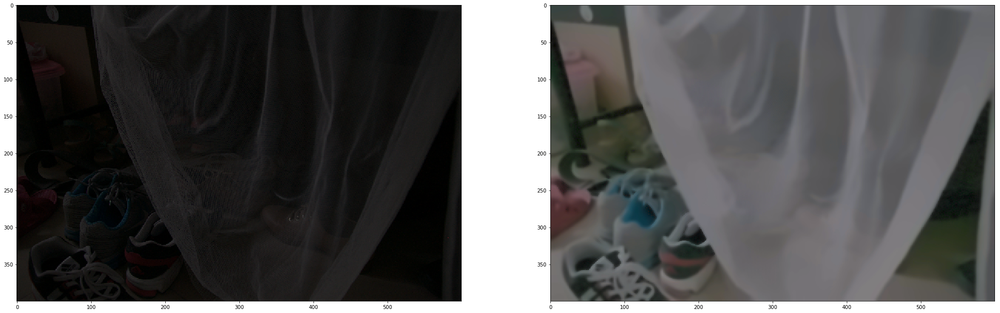

In [22]:
display(img1,tone_mapped_img)

## Colour/Style Enhancement

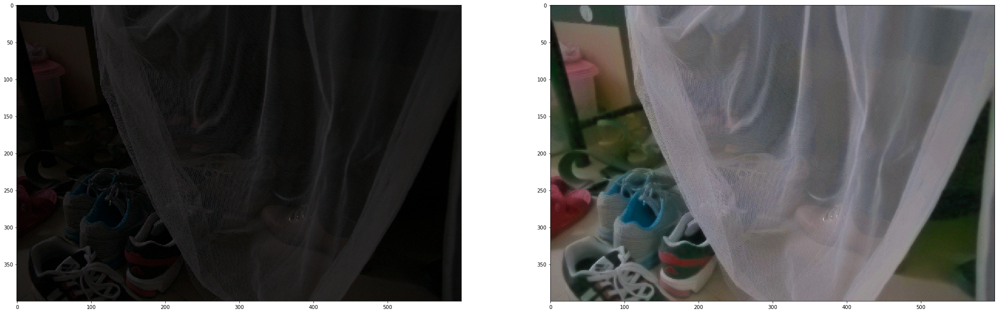

In [23]:
image = tone_mapped_img
original = img1
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV).astype(np.float32)
h, s, v = cv2.split(hsv)

mean_saturation = np.mean(s)

if mean_saturation < 40:
    sat_boost = 1.8
elif mean_saturation < 70:
    sat_boost = 1.5
elif mean_saturation < 100:
    sat_boost = 1.2
else:
    sat_boost = 1.0

s = np.clip(s * sat_boost, 0, 255)

blurred_original = cv2.GaussianBlur(original, (9, 9), 0)
detail_layer = cv2.addWeighted(original, 1.7, blurred_original, -0.5, 0)

hsv_enhanced = cv2.merge([h, s, v])
result = cv2.cvtColor(hsv_enhanced.astype(np.uint8), cv2.COLOR_HSV2BGR)

final_result = cv2.addWeighted(result, 0.9, detail_layer, 0.8, 0)

display(img1,final_result)

## Sharpening of the image

In [24]:
image = final_result
blurred = cv2.GaussianBlur(image, (0, 0),1.2)
alpha = 1
sharpened_image = cv2.addWeighted(image, 1 + alpha, blurred, -alpha, 0)

## Final Output Enhanced Image

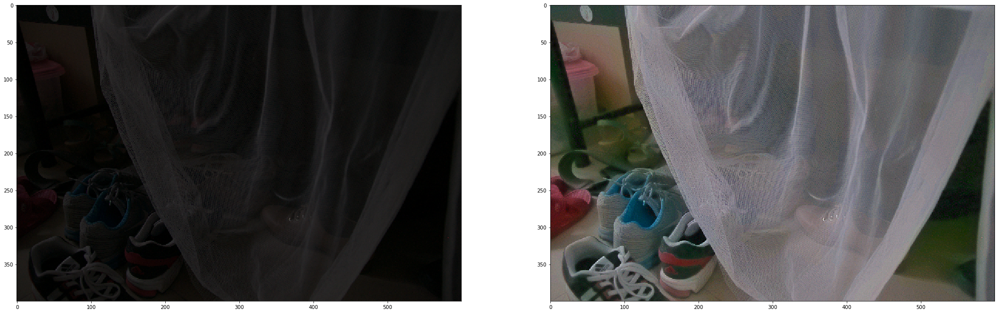

In [25]:
display(img1,sharpened_image)